In [2]:
import numpy as np
import pulser
from pprint import pprint
import matplotlib.pyplot as plt

from scipy.linalg import expm

from pulser import Pulse, Sequence, Register
from pulser_simulation import QutipEmulator
from pulser.waveforms import RampWaveform
from pulser.devices import Chadoq2

from IPython.display import HTML
import matplotlib.animation

In [3]:
def Kron(*arr):
    K = arr[0]
    for i in range(1,len(arr)):
        K = np.kron(K,arr[i])
    return K

I = np.eye(2)
Z = np.array([[1,0],[0,-1]])
X = np.array([[0,1],[1,0]])

n = 6

Xi = np.concatenate(([Kron(X,*[I]*(n-1))],[Kron(*([I]*i+[X]+[I]*(n-i-1))) for i in range(1,n-1)],[Kron(*[I]*(n-1),X)]))
Zi = np.concatenate(([Kron(Z,*[I]*(n-1))],[Kron(*([I]*i+[Z]+[I]*(n-i-1))) for i in range(1,n-1)],[Kron(*[I]*(n-1),Z)]))
Ni = (np.eye(2**n)+Zi)/2



Omega = 1   * 2*np.pi
delta = 0.7 * 2*np.pi
U = 138e5

H = Omega/2*np.sum(Xi, axis=0) - delta*np.sum(Ni, axis=0)

v = Kron(*[np.array([0,1])]*n)

def Obs(v): # ,A
    # return (np.sum( [v.transpose().conj()@Ni[i]@v for i in A] )).real/len(A)
    return np.sum([ (v.transpose().conj()@Ni[i]@v).real for i in range(6)])



11.401181768748398


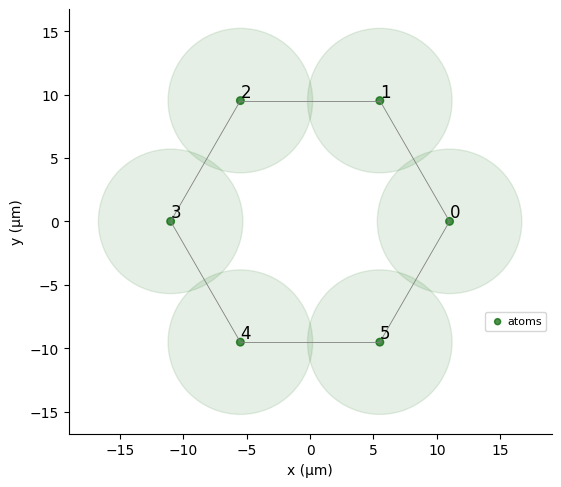

In [4]:
print((U/Omega)**(1/6))
w = np.exp(1j*2*np.pi/(n))

rNN = 11
G1 = [[rNN/(2*np.sin(np.pi/(n)))*(w**i).real,rNN/(2*np.sin(np.pi/(n)))*(w**i).imag] for i in range(n)]

Rij1 = np.zeros((n,n))
for i in range(n):
    for j in range(i):
        Rij1[i,j] = np.linalg.norm(np.array(G1[i])-np.array(G1[j]))
        Rij1[j,i] = Rij1[i,j]

H1 = H.copy()
for i in range(n):
    for j in range(i):
        H1 += U/Rij1[i,j]**6 * (Ni[i]@Ni[j])# + Ni[j]@Ni[i])/2

qubits1 = dict(enumerate(G1))
reg1 = Register(qubits1)
reg1.draw(blockade_radius=(U/Omega)**(1/6), draw_half_radius=True, draw_graph=True)

In [5]:
M = 100
T = np.linspace(0.05,2.5,M)

O1_B = np.zeros((M))
O1_C = np.zeros((M))
O2_B = np.zeros((M))
O2_C = np.zeros((M))
for i,t in enumerate(T):
    vt = expm(-1j*t*H1)@v
    O1_B[i] = Obs(vt)#,B
    O1_C[i] = Obs(vt)#,C

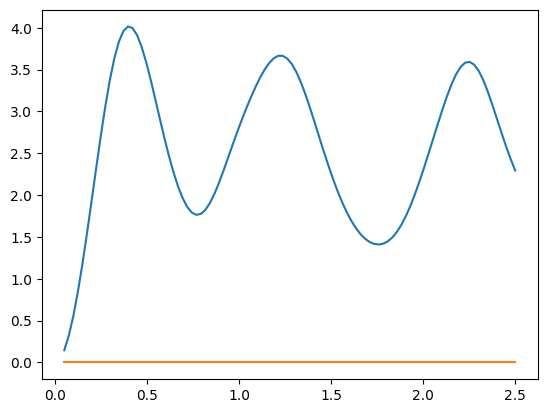

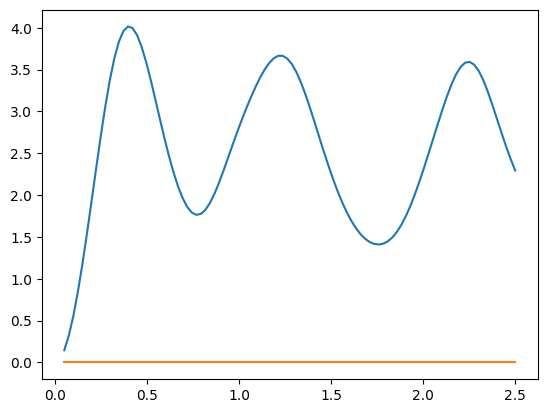

In [6]:

plt.plot(T,O1_B)
plt.plot(T,O2_B)
# plt.ylim([0,0.5])
plt.show()

plt.plot(T,O1_C)
plt.plot(T,O2_C)
plt.show()

In [7]:
import scipy

FFT = np.zeros(M//2)
dt = T[1]-T[0]
xf = scipy.fft.fftfreq(M, dt)[:M//2]

FFT[:] = 2/M*np.abs(scipy.fft.fft(O1_B[:])[:M//2])

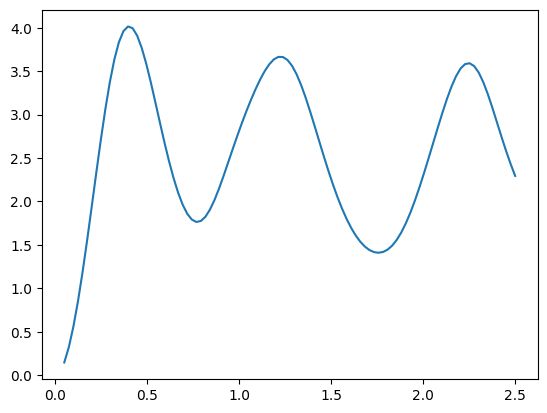

In [8]:
import scipy.signal as sig


#T = 2  # signal duration
#dt = 1/500  # sample interval/spacing
dt = T[1] - T[0]
freq_s = 1/dt  # sampling frequency
N = T[-1] / dt  # number of samples
#ts = np.arange(N) * dt  # times
ts = T
#  constructing a chirp multiplied by a Gaussian
t0 = T[-1]/2
freq = np.linspace(10, 30, int(N))
sigma = 0.1
signal = O1_B #np.cos((ts-t0) * 2 * np.pi * freq) * np.exp(-(ts-t0)**2/(2*sigma**2))/np.sqrt(sigma)

# adding some noise
#signal += np.random.randn(len(signal))*0.5


#  plotting the signal
plt.figure()
plt.plot(ts, signal)
plt.show()

In [9]:
import tftb
# first looking at the power of the short time fourier transform (SFTF):
nperseg = 2**6  # window size of the STFT
f_stft, t_stft, Zxx = sig.stft(signal, freq_s, nperseg=nperseg,
                           noverlap=nperseg-1, return_onesided=False)

# shifting the frequency axis for better representation
Zxx = np.fft.fftshift(Zxx, axes=0)
f_stft = np.fft.fftshift(f_stft)

# Doing the WVT
wvd = tftb.processing.WignerVilleDistribution(signal, timestamps=ts)
tfr_wvd, t_wvd, f_wvd = wvd.run()
# here t_wvd is the same as our ts, and f_wvd are the "normalized frequencies"
# so we will not use them and construct our own.

ModuleNotFoundError: No module named 'tftb'

(0.0, 5.0)

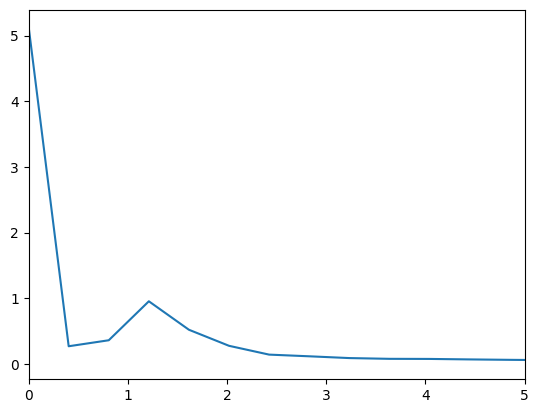

In [ ]:
plt.plot(xf,FFT)

plt.xlim(0,5)


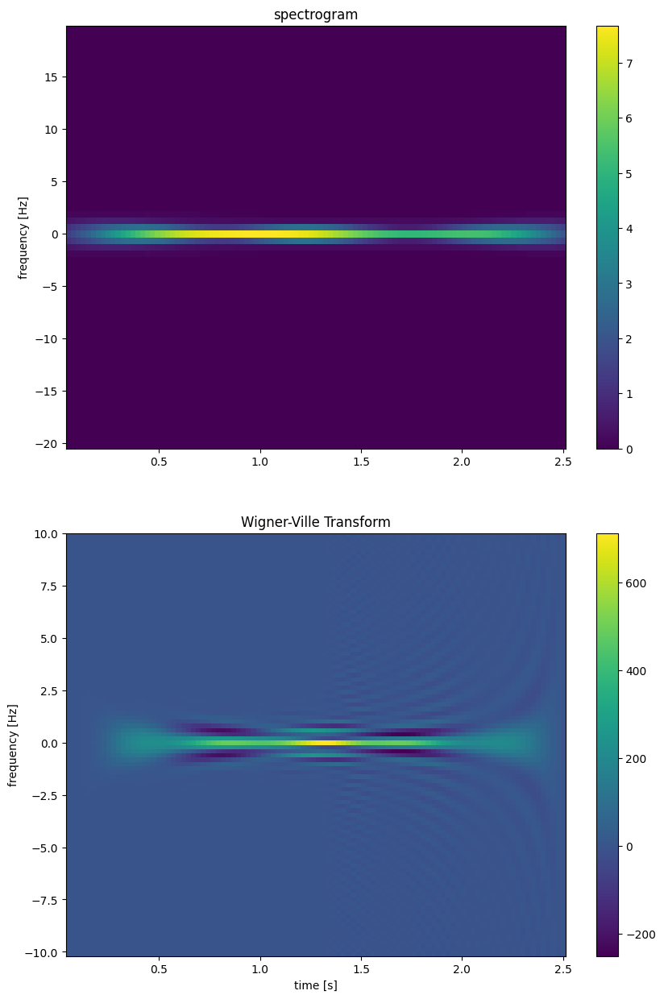

In [ ]:
import tftb

# Doing the WVT
wvd = tftb.processing.WignerVilleDistribution(signal, timestamps=ts)
tfr_wvd, t_wvd, f_wvd = wvd.run()

f, axx = plt.subplots(2, 1,figsize=(10,15))

df1 = f_stft[1] - f_stft[0]  # the frequency step
im = axx[0].imshow(np.real(Zxx * np.conj(Zxx)), aspect='auto',
          interpolation=None, origin='lower',
          extent=(ts[0] - dt/2, ts[-1] + dt/2,
                  f_stft[0] - df1/2, f_stft[-1] + df1/2))
axx[0].set_ylabel('frequency [Hz]')
plt.colorbar(im, ax=axx[0])
axx[0].set_title('spectrogram')


# because of how they implemented WVT, the maximum frequency is half of
# the sampling Nyquist frequency, so 125 Hz instead of 250 Hz, and the sampling
# is 2 * dt instead of dt
f_wvd = np.fft.fftshift(np.fft.fftfreq(tfr_wvd.shape[0], d=2 * dt))
df_wvd = f_wvd[1]-f_wvd[0]  # the frequency step in the WVT
im = axx[1].imshow(np.fft.fftshift(tfr_wvd, axes=0), aspect='auto', origin='lower',
       extent=(ts[0] - dt/2, ts[-1] + dt/2,
               f_wvd[0]-df_wvd/2, f_wvd[-1]+df_wvd/2))
axx[1].set_xlabel('time [s]')
axx[1].set_ylabel('frequency [Hz]')
plt.colorbar(im, ax=axx[1])
axx[1].set_title('Wigner-Ville Transform')
plt.show()

In [ ]:
#plop

In [ ]:
print(n)

6


In [ ]:
K = 100
rNN_vec = np.linspace(25,0.5,K)
M = 200
T = np.linspace(0,15,M)

O = np.zeros((K,M))

#w = np.exp(1j*2*np.pi/(n+1))


for k in range(K):
    if(k%10==0):
        print(k)
    rNN = rNN_vec[k]
    G1 = [[rNN/(2*np.sin(np.pi/(n)))*(w**i).real,rNN/(2*np.sin(np.pi/(n)))*(w**i).imag] for i in range(n)]

    Rij1 = np.zeros((n,n))
    for i in range(n):
        for j in range(i):
            Rij1[i,j] = np.linalg.norm(np.array(G1[i])-np.array(G1[j]))
            Rij1[j,i] = Rij1[i,j]

    H1 = H.copy()
    for i in range(n):
        for j in range(i):
            H1 += U/Rij1[i,j]**6 * (Ni[i]@Ni[j])
            
    for i,t in enumerate(T):
        vt = expm(-1j*t*H1)@v
        O[k,i] = Obs(vt)#,0)

0
10
20
30
40
50
60
70
80
90


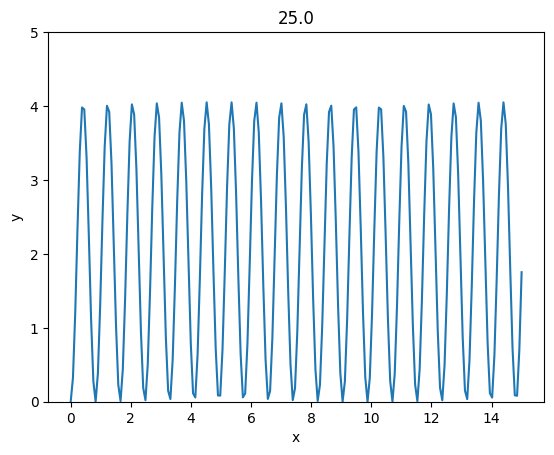

In [ ]:
fig, ax = plt.subplots()
l, = plt.plot(T,O[0,:])
ax.set_ylabel('y')
ax.set_xlabel('x')
ax.set_ylim([0,5])

def animate(i):
    l.set_data(T,O[i,:])
    ax.set_title(rNN_vec[i])
ani = matplotlib.animation.FuncAnimation(fig, animate, interval=25, frames=K)

       
HTML(ani.to_jshtml())

In [ ]:
import scipy

In [ ]:
FFT = np.zeros((K,M//2))
dt = T[1]-T[0]
xf = scipy.fft.fftfreq(M, dt)[:M//2]
for i in range(K):
    FFT[i,:] = 2/M*np.abs(scipy.fft.fft(O[i,:])[:M//2])
    # plt.plot(xf, 2.0/M * np.abs(yf[0:M//2]))

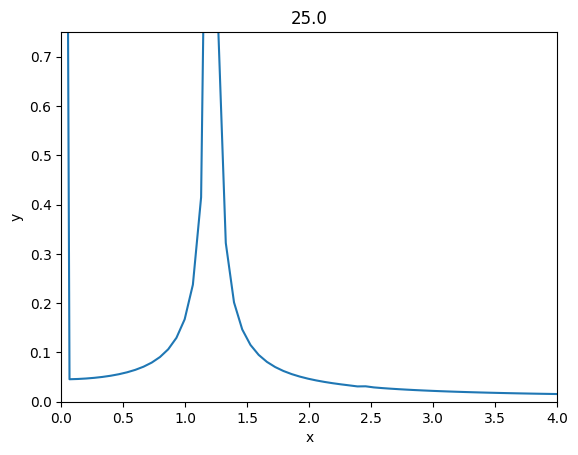

In [ ]:
fig, ax = plt.subplots()
l, = plt.plot(xf,FFT[0,:])
ax.set_ylabel('y')
ax.set_xlabel('x')
ax.set_ylim([0,0.75])
ax.set_xlim([0,4])

def animate(i):
    l.set_data(xf,FFT[i,:])
    ax.set_title(rNN_vec[i])
ani = matplotlib.animation.FuncAnimation(fig, animate, interval=100, frames=K)

       
HTML(ani.to_jshtml())

# ani.save('FFT_rNN_hexa.gif')

In [ ]:
Omega/2/np.pi*np.sqrt(6)

2.449489742783178

In [ ]:
print(G1)

[[0.5000000000000001, 0.0], [0.2500000000000001, 0.4330127018922194], [-0.24999999999999994, 0.4330127018922195], [-0.5000000000000001, 1.8685194523773372e-16], [-0.25000000000000033, -0.43301270189221935], [0.24999999999999978, -0.4330127018922197]]


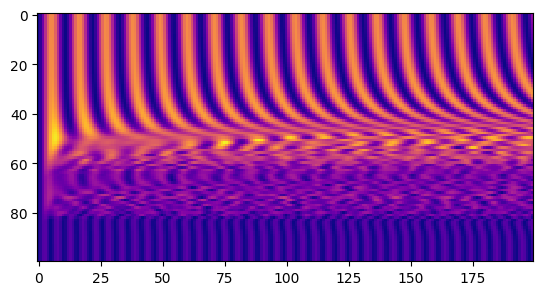

In [ ]:

plt.imshow(O, cmap='plasma', interpolation='nearest')
plt.show()

In [ ]:

plt.imshow(np.log(FFT), cmap='plasma',origin='lower', interpolation='nearest')


plt.show()

NameError: name 'plt' is not defined

In [ ]:
np.exp(FFT)
print(FFT)

[[4.00848159e+00 4.55878783e-02 4.61425886e-02 ... 1.17489877e-02
  1.17396255e-02 1.17340149e-02]
 [4.00997818e+00 4.57650210e-02 4.63131715e-02 ... 1.14222677e-02
  1.14131130e-02 1.14076267e-02]
 [4.01162426e+00 4.59157600e-02 4.64569186e-02 ... 1.10700915e-02
  1.10611598e-02 1.10558072e-02]
 ...
 [9.18388781e-01 6.11008968e-03 6.12491171e-03 ... 3.34364362e-03
  3.33805972e-03 3.33471855e-03]
 [9.18392236e-01 6.11096356e-03 6.12577768e-03 ... 3.34218704e-03
  3.33660728e-03 3.33326430e-03]
 [9.18393503e-01 6.11105876e-03 6.12596785e-03 ... 3.34188849e-03
  3.33630482e-03 3.33296571e-03]]
